In [178]:
import torch
from torch import nn
from pathlib import Path
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import random
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from typing import Tuple, Dict, List
import seaborn as sns
import os
import pandas as pd
from collections import Counter
%matplotlib inline

In [179]:
device="cuda" if torch.cuda.is_available() else "cpu"
device

'cpu'

In [180]:
image_path = "/kaggle/input/pizza-steak-sushi/"
train_dir = os.path.join(image_path, "train")
test_dir = os.path.join(image_path, "test")

print(train_dir, test_dir)

/kaggle/input/pizza-steak-sushi/train /kaggle/input/pizza-steak-sushi/test


# visualize images from train data

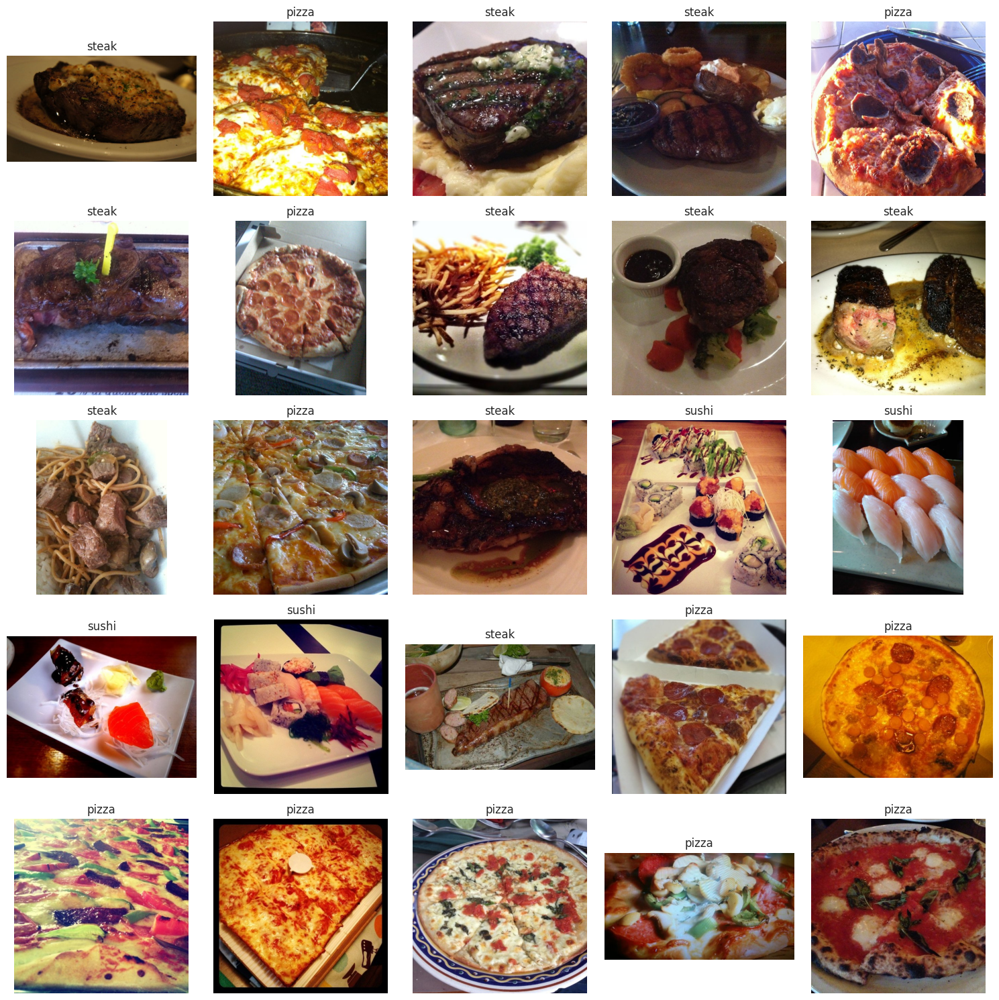

In [181]:
classes = os.listdir(train_dir)
image_paths = []
labels = []

for label in classes:
    class_dir = os.path.join(train_dir, label)
    for img_name in os.listdir(class_dir):
        image_paths.append(os.path.join(class_dir, img_name))
        labels.append(label)

sample_indices = random.sample(range(len(image_paths)), 25)
sample_images = [image_paths[i] for i in sample_indices]
sample_labels = [labels[i] for i in sample_indices]

fig, axes = plt.subplots(5, 5, figsize=(15, 15))
axes = axes.flatten()

for img_path, ax, label in zip(sample_images, axes, sample_labels):
    img = Image.open(img_path)
    ax.imshow(img)
    ax.set_title(label)
    ax.axis('off')

plt.tight_layout()
plt.show()


# visualize Images from test data

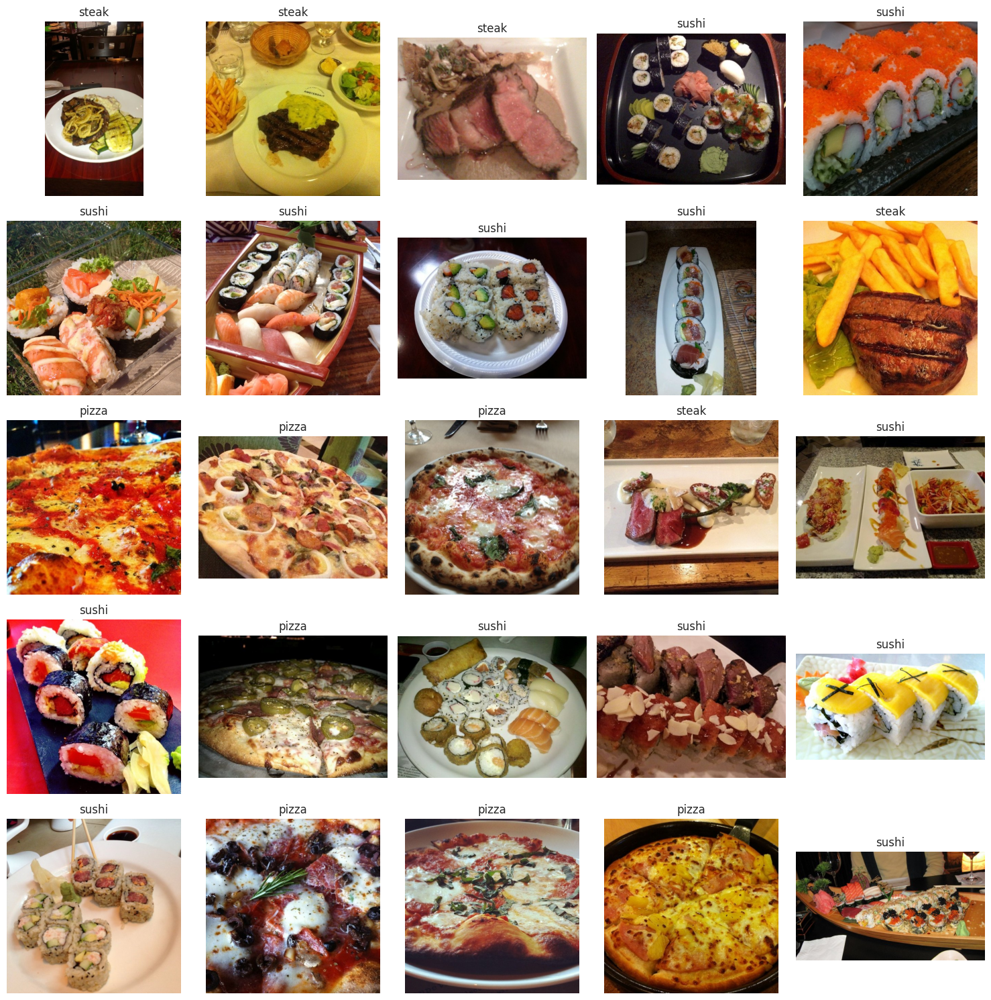

In [182]:
classes = os.listdir(test_dir)
image_paths = []
labels = []

for label in classes:
    class_dir = os.path.join(test_dir, label)
    for img_name in os.listdir(class_dir):
        image_paths.append(os.path.join(class_dir, img_name))
        labels.append(label)

sample_indices = random.sample(range(len(image_paths)), 25)
sample_images = [image_paths[i] for i in sample_indices]
sample_labels = [labels[i] for i in sample_indices]

fig, axes = plt.subplots(5, 5, figsize=(15, 15))
axes = axes.flatten()

for img_path, ax, label in zip(sample_images, axes, sample_labels):
    img = Image.open(img_path)
    ax.imshow(img)
    ax.set_title(label)
    ax.axis('off')

plt.tight_layout()
plt.show()

# transform Images

In [183]:
data_transform=transforms.Compose([transforms.Resize(size=(64,64)),transforms.RandomHorizontalFlip(p=0.5),
                                 transforms.ToTensor()])

In [184]:
from pathlib import Path


image_path = Path("/kaggle/input/pizza-steak-sushi/")

# Get list of image paths
image_path_list = list(image_path.glob("*/*/*.jpg"))

# transform Images

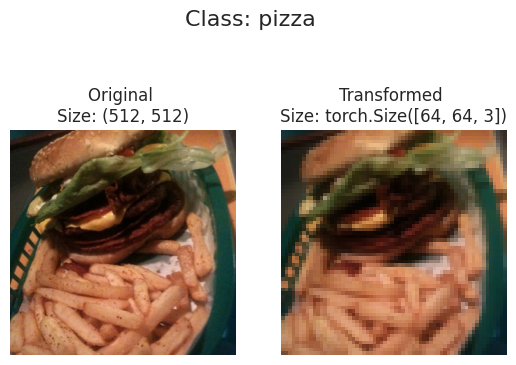

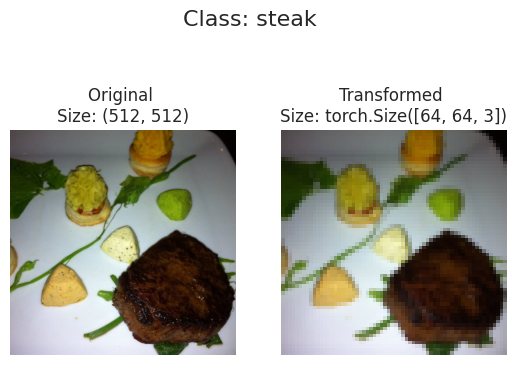

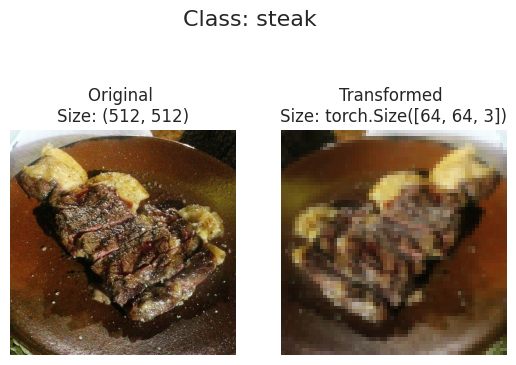

In [185]:
def plot_transformed_images(image_paths, transform, n=3, seed=42):
    random.seed(seed)
    random_image_paths = random.sample(image_paths, k=n)
    for image_path in random_image_paths:
        with Image.open(image_path) as f:
            fig, ax = plt.subplots(1, 2)
            ax[0].imshow(f)
            ax[0].set_title(f"Original \nSize: {f.size}")
            ax[0].axis("off")

            transformed_image = transform(f).permute(1, 2, 0)
            ax[1].imshow(transformed_image)
            ax[1].set_title(f"Transformed \nSize: {transformed_image.shape}")
            ax[1].axis("off")

            fig.suptitle(f"Class: {image_path.parent.stem}", fontsize=16)

plot_transformed_images(image_path_list, transform=data_transform, n=3)

# Make function to find classes in target directory

In [186]:
# Make function to find classes in target directory
def find_classes(directory: str) -> Tuple[List[str], Dict[str, int]]:
    """Finds the class folder names in a target directory.
    
    Assumes target directory is in standard image classification format.

    Args:
        directory (str): target directory to load classnames from.

    Returns:
        Tuple[List[str], Dict[str, int]]: (list_of_class_names, dict(class_name: idx...))
    
    Example:
        find_classes("food_images/train")
        >>> (["class_1", "class_2"], {"class_1": 0, ...})
    """
    # 1. Get the class names by scanning the target directory
    classes = sorted(entry.name for entry in os.scandir(directory) if entry.is_dir())
    
    # 2. Raise an error if class names not found
    if not classes:
        raise FileNotFoundError(f"Couldn't find any classes in {directory}.")
        
    # 3. Create a dictionary of index labels (computers prefer numerical rather than string labels)
    class_to_idx = {cls_name: i for i, cls_name in enumerate(classes)}
    return classes, class_to_idx

In [187]:
find_classes(train_dir)

(['pizza', 'steak', 'sushi'], {'pizza': 0, 'steak': 1, 'sushi': 2})

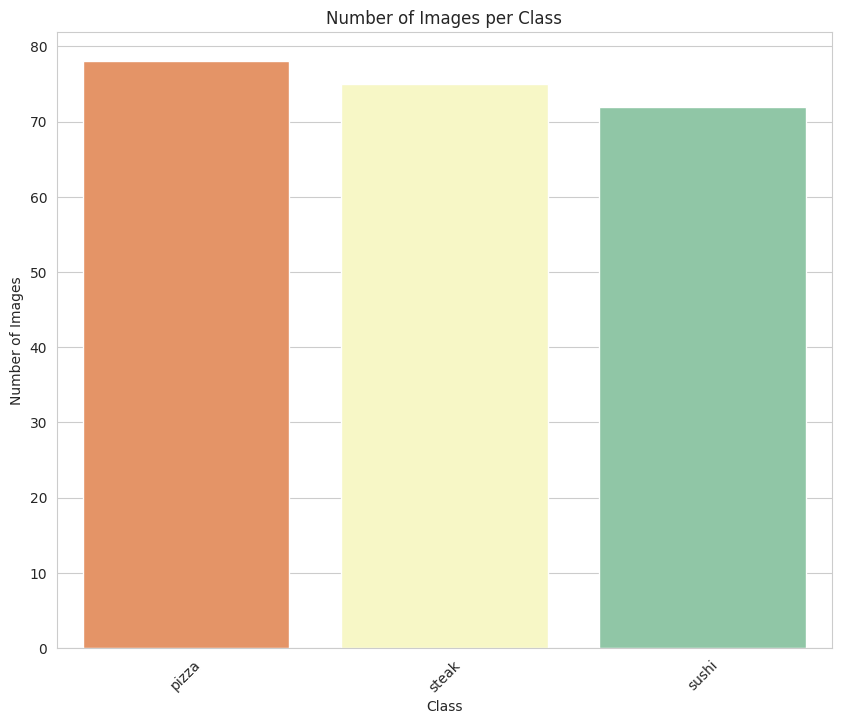

In [188]:
new_path="/kaggle/input/pizza-steak-sushi/train/"
class_names = ['pizza', 'steak', 'sushi']  
data = {}
for class_name in class_names:
    class_dir = os.path.join(new_path, class_name)
    data[class_name] = len(os.listdir(class_dir))

df = pd.DataFrame(list(data.items()), columns=['Class', 'Count'])

plt.figure(figsize=(10,8))
sns.barplot(data=df, x='Class', y='Count', palette='Spectral')
plt.title('Number of Images per Class')
plt.xlabel('Class')
plt.ylabel('Number of Images')
plt.xticks(rotation=45)
plt.show()

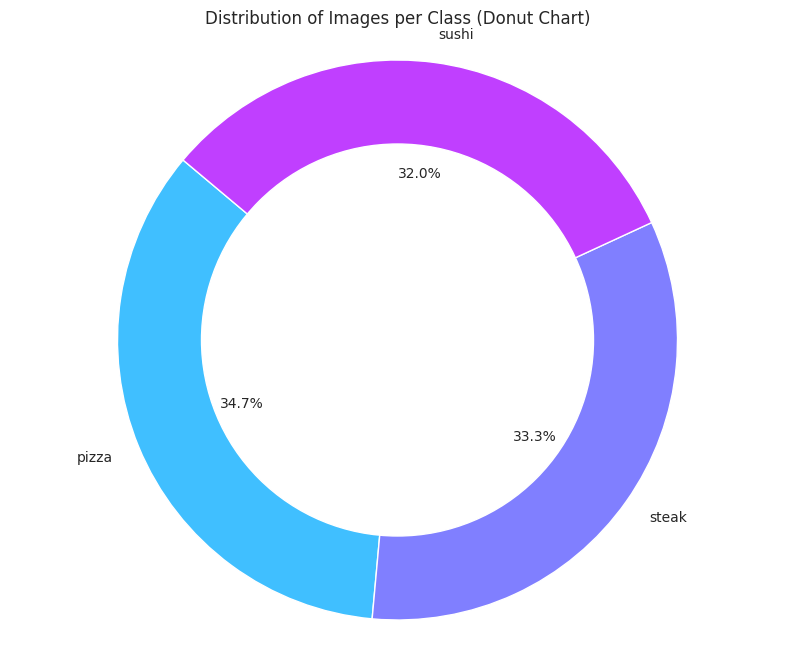

In [189]:
data = {}
for class_name in class_names:
    class_dir = os.path.join(new_path, class_name)
    data[class_name] = len(os.listdir(class_dir))

df = pd.DataFrame(list(data.items()), columns=['Class', 'Count'])

plt.figure(figsize=(10,8))
plt.pie(df['Count'], labels=df['Class'], autopct='%1.1f%%', startangle=140, colors=sns.color_palette("cool", len(class_names)))
centre_circle = plt.Circle((0, 0), 0.70, fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.axis('equal')
plt.title('Distribution of Images per Class (Donut Chart)')
plt.show()

# Create a custom Dataset to replicate ImageFolder

In [190]:
from torch.utils.data import Dataset
from typing import Tuple, List
import pathlib
# 1. Subclass torch.utils.data.Dataset
class ImageFolderCustom(Dataset):
    
    # 2. Initialize with a targ_dir and transform (optional) parameter
    def __init__(self, targ_dir: str, transform=None) -> None:
        
        # 3. Create class attributes
        # Get all image paths
        self.paths = list(pathlib.Path(targ_dir).glob("*/*.jpg")) # note: you'd have to update this if you've got .png's or .jpeg's
        # Setup transforms
        self.transform = transform
        # Create classes and class_to_idx attributes
        self.classes, self.class_to_idx = find_classes(targ_dir)

    # 4. Make function to load images
    def load_image(self, index: int) -> Image.Image:
        "Opens an image via a path and returns it."
        image_path = self.paths[index]
        return Image.open(image_path) 
    
    # 5. Overwrite the __len__() method (optional but recommended for subclasses of torch.utils.data.Dataset)
    def __len__(self) -> int:
        "Returns the total number of samples."
        return len(self.paths)
    
    # 6. Overwrite the __getitem__() method (required for subclasses of torch.utils.data.Dataset)
    def __getitem__(self, index: int) -> Tuple[torch.Tensor, int]:
        "Returns one sample of data, data and label (X, y)."
        img = self.load_image(index)
        class_name  = self.paths[index].parent.name # expects path in data_folder/class_name/image.jpeg
        class_idx = self.class_to_idx[class_name]

        # Transform if necessary
        if self.transform:
            return self.transform(img), class_idx # return data, label (X, y)
        else:
            return img, class_idx # return data, label (X, y)

# Augment train data

In [191]:
train_transforms = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ToTensor()
])

# Don't augment test data, only reshape
test_transforms = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor()
])

In [192]:


train_data_custom = ImageFolderCustom(targ_dir=train_dir, 
                                      transform=train_transforms)
test_data_custom = ImageFolderCustom(targ_dir=test_dir, 
                                     transform=test_transforms)
train_data_custom, test_data_custom

(<__main__.ImageFolderCustom at 0x7c1e872da4d0>,
 <__main__.ImageFolderCustom at 0x7c1e872d82b0>)

In [193]:
len(train_data_custom), len(test_data_custom)

(225, 75)

In [194]:
train_data_custom.classes

['pizza', 'steak', 'sushi']

In [195]:
train_data_custom.class_to_idx

{'pizza': 0, 'steak': 1, 'sushi': 2}

# Turn custom loaded images into DataLoader's

In [196]:
train_dataloader_custom = DataLoader(dataset=train_data_custom, # use custom created train Dataset
                                     batch_size=1, # how many samples per batch?
                                     num_workers=0, # how many subprocesses to use for data loading? (higher = more)
                                     shuffle=True) # shuffle the data?

test_dataloader_custom = DataLoader(dataset=test_data_custom, # use custom created test Dataset
                                    batch_size=1, 
                                    num_workers=0, 
                                    shuffle=False) # don't usually need to shuffle testing data

train_dataloader_custom, test_dataloader_custom

(<torch.utils.data.dataloader.DataLoader at 0x7c1e872d8460>,
 <torch.utils.data.dataloader.DataLoader at 0x7c1e872da830>)

# Get image and label from custom DataLoader

In [197]:
img_custom, label_custom = next(iter(train_dataloader_custom))

# Batch size will now be 1, try changing the batch_size parameter above and see what happens
print(f"Image shape: {img_custom.shape} -> [batch_size, color_channels, height, width]")
print(f"Label shape: {label_custom.shape}")

Image shape: torch.Size([1, 3, 224, 224]) -> [batch_size, color_channels, height, width]
Label shape: torch.Size([1])


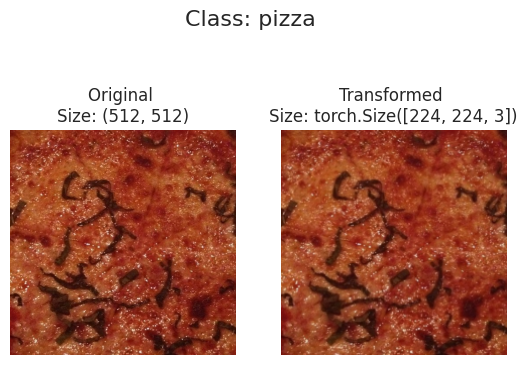

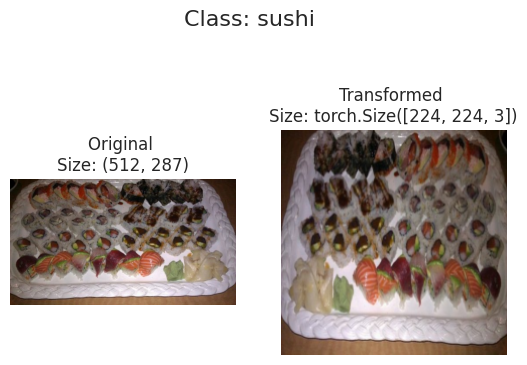

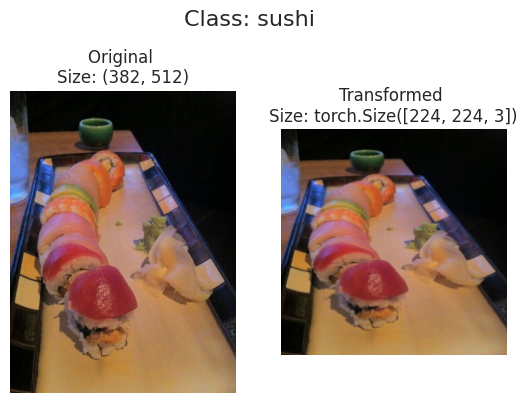

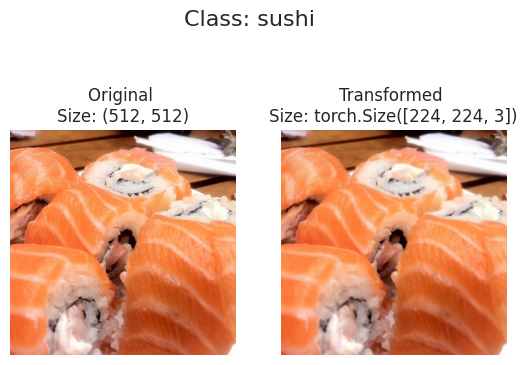

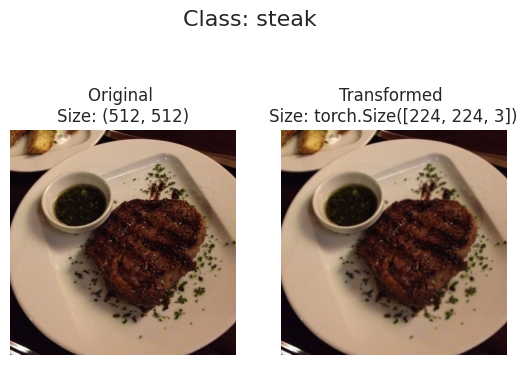

In [198]:
plot_transformed_images(
    image_paths=image_path_list,
    transform=train_transforms,
    n=5,
    seed=None
)

In [199]:
BATCH_SIZE = 32
NUM_WORKERS = os.cpu_count()
print(f"Creating DataLoader's with batch size {BATCH_SIZE} and {NUM_WORKERS} workers.")

Creating DataLoader's with batch size 32 and 4 workers.


# Create TinyVGG model class

In [200]:
import torch
import torch.nn as nn

class TinyVGG(nn.Module):
    def __init__(self, input_shape: int, hidden_units: int, output_shape: int) -> None:
        super().__init__()
        self.conv_block_1 = nn.Sequential(
            nn.Conv2d(in_channels=input_shape, out_channels=hidden_units, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.Conv2d(in_channels=hidden_units, out_channels=hidden_units, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )
        self.conv_block_2 = nn.Sequential(
            nn.Conv2d(hidden_units, hidden_units, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(hidden_units, hidden_units, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2)
        )
        
        # Calculate the output size of conv_block_2
        self.features_size = self._get_conv_output_size((input_shape, 224, 224), hidden_units)
        
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(in_features=self.features_size, out_features=output_shape)
        )
    
    def _get_conv_output_size(self, shape, hidden_units):
        batch_size = 1
        input = torch.autograd.Variable(torch.rand(batch_size, *shape))
        output_feat = self._forward_features(input)
        n_size = output_feat.data.view(batch_size, -1).size(1)
        return n_size

    def _forward_features(self, x):
        x = self.conv_block_1(x)
        x = self.conv_block_2(x)
        return x
    
    def forward(self, x: torch.Tensor):
        x = self.conv_block_1(x)
        x = self.conv_block_2(x)
        x = self.classifier(x)
        return x

# Usage
torch.manual_seed(42)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_0 = TinyVGG(input_shape=3, hidden_units=10, output_shape=len(train_data_custom.classes)).to(device)

# Print model summary
from torchinfo import summary
summary(model_0, input_size=[1, 3, 224, 224])

Layer (type:depth-idx)                   Output Shape              Param #
TinyVGG                                  [1, 3]                    --
├─Sequential: 1-1                        [1, 10, 112, 112]         --
│    └─Conv2d: 2-1                       [1, 10, 224, 224]         280
│    └─ReLU: 2-2                         [1, 10, 224, 224]         --
│    └─Conv2d: 2-3                       [1, 10, 224, 224]         910
│    └─ReLU: 2-4                         [1, 10, 224, 224]         --
│    └─MaxPool2d: 2-5                    [1, 10, 112, 112]         --
├─Sequential: 1-2                        [1, 10, 56, 56]           --
│    └─Conv2d: 2-6                       [1, 10, 112, 112]         910
│    └─ReLU: 2-7                         [1, 10, 112, 112]         --
│    └─Conv2d: 2-8                       [1, 10, 112, 112]         910
│    └─ReLU: 2-9                         [1, 10, 112, 112]         --
│    └─MaxPool2d: 2-10                   [1, 10, 56, 56]           --
├─Sequentia

#  Create train & test loop functions

In [201]:
def train_step(model: torch.nn.Module, 
               dataloader: torch.utils.data.DataLoader, 
               loss_fn: torch.nn.Module, 
               optimizer: torch.optim.Optimizer):
    # Put model in train mode
    model.train()
    
    # Setup train loss and train accuracy values
    train_loss, train_acc = 0, 0
    
    # Loop through data loader data batches
    for batch, (X, y) in enumerate(dataloader):
        # Send data to target device
        X, y = X.to(device), y.to(device)

        # 1. Forward pass
        y_pred = model(X)

        # 2. Calculate  and accumulate loss
        loss = loss_fn(y_pred, y)
        train_loss += loss.item() 

        # 3. Optimizer zero grad
        optimizer.zero_grad()

        # 4. Loss backward
        loss.backward()

        # 5. Optimizer step
        optimizer.step()

        # Calculate and accumulate accuracy metrics across all batches
        y_pred_class = torch.argmax(torch.softmax(y_pred, dim=1), dim=1)
        train_acc += (y_pred_class == y).sum().item()/len(y_pred)

    # Adjust metrics to get average loss and accuracy per batch 
    train_loss = train_loss / len(dataloader)
    train_acc = train_acc / len(dataloader)
    return train_loss, train_acc

In [202]:
def test_step(model: torch.nn.Module, 
              dataloader: torch.utils.data.DataLoader, 
              loss_fn: torch.nn.Module):
    # Put model in eval mode
    model.eval() 
    
    # Setup test loss and test accuracy values
    test_loss, test_acc = 0, 0
    
    # Turn on inference context manager
    with torch.inference_mode():
        # Loop through DataLoader batches
        for batch, (X, y) in enumerate(dataloader):
            # Send data to target device
            X, y = X.to(device), y.to(device)
    
            # 1. Forward pass
            test_pred_logits = model(X)

            # 2. Calculate and accumulate loss
            loss = loss_fn(test_pred_logits, y)
            test_loss += loss.item()
            
            # Calculate and accumulate accuracy
            test_pred_labels = test_pred_logits.argmax(dim=1)
            test_acc += ((test_pred_labels == y).sum().item()/len(test_pred_labels))
            
    # Adjust metrics to get average loss and accuracy per batch 
    test_loss = test_loss / len(dataloader)
    test_acc = test_acc / len(dataloader)
    return test_loss, test_acc

# Creating a train() function to combine train_step() and test_step()

In [203]:
from tqdm.auto import tqdm

# 1. Take in various parameters required for training and test steps
def train(model: torch.nn.Module, 
          train_dataloader: torch.utils.data.DataLoader, 
          test_dataloader: torch.utils.data.DataLoader, 
          optimizer: torch.optim.Optimizer,
          loss_fn: torch.nn.Module = nn.CrossEntropyLoss(),
          epochs: int = 5):
    
    # 2. Create empty results dictionary
    results = {"train_loss": [],
        "train_acc": [],
        "test_loss": [],
        "test_acc": []
    }
    
    # 3. Loop through training and testing steps for a number of epochs
    for epoch in tqdm(range(epochs)):
        train_loss, train_acc = train_step(model=model,
                                           dataloader=train_dataloader,
                                           loss_fn=loss_fn,
                                           optimizer=optimizer)
        test_loss, test_acc = test_step(model=model,
            dataloader=test_dataloader,
            loss_fn=loss_fn)
        
        # 4. Print out what's happening
        print(
            f"Epoch: {epoch+1} | "
            f"train_loss: {train_loss:.4f} | "
            f"train_acc: {train_acc:.4f} | "
            f"test_loss: {test_loss:.4f} | "
            f"test_acc: {test_acc:.4f}"
        )

        # 5. Update results dictionary
        # Ensure all data is moved to CPU and converted to float for storage
        results["train_loss"].append(train_loss.item() if isinstance(train_loss, torch.Tensor) else train_loss)
        results["train_acc"].append(train_acc.item() if isinstance(train_acc, torch.Tensor) else train_acc)
        results["test_loss"].append(test_loss.item() if isinstance(test_loss, torch.Tensor) else test_loss)
        results["test_acc"].append(test_acc.item() if isinstance(test_acc, torch.Tensor) else test_acc)

    # 6. Return the filled results at the end of the epochs
    return results

# Train and Evaluate Model 0

In [204]:
NUM_EPOCHS = 20

# Recreate an instance of TinyVGG
model_0 = TinyVGG(input_shape=3, # number of color channels (3 for RGB) 
                  hidden_units=10, 
                  output_shape=len(train_data_custom.classes)).to(device)

# Setup loss function and optimizer
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(params=model_0.parameters(), lr=0.001)

# Start the timer
from timeit import default_timer as timer 
start_time = timer()

# Train model_0 
model_0_results = train(model=model_0, 
                        train_dataloader=train_dataloader_custom,
                        test_dataloader=test_dataloader_custom,
                        optimizer=optimizer,
                        loss_fn=loss_fn, 
                        epochs=NUM_EPOCHS)

# End the timer and print out how long it took
end_time = timer()
print(f"Total training time: {end_time-start_time:.3f} seconds")

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.2185 | train_acc: 0.4489 | test_loss: 1.0015 | test_acc: 0.4667
Epoch: 2 | train_loss: 0.9462 | train_acc: 0.6222 | test_loss: 1.0526 | test_acc: 0.4267
Epoch: 3 | train_loss: 0.8646 | train_acc: 0.6489 | test_loss: 1.0087 | test_acc: 0.4533
Epoch: 4 | train_loss: 0.7944 | train_acc: 0.6756 | test_loss: 0.9789 | test_acc: 0.4667
Epoch: 5 | train_loss: 0.7123 | train_acc: 0.7156 | test_loss: 1.1982 | test_acc: 0.4800
Epoch: 6 | train_loss: 0.7047 | train_acc: 0.6978 | test_loss: 1.0749 | test_acc: 0.5200
Epoch: 7 | train_loss: 0.6270 | train_acc: 0.7333 | test_loss: 0.9914 | test_acc: 0.4800
Epoch: 8 | train_loss: 0.5072 | train_acc: 0.7956 | test_loss: 1.2357 | test_acc: 0.5067
Epoch: 9 | train_loss: 0.4921 | train_acc: 0.8489 | test_loss: 1.0694 | test_acc: 0.5200
Epoch: 10 | train_loss: 0.3389 | train_acc: 0.8711 | test_loss: 1.1599 | test_acc: 0.5333
Epoch: 11 | train_loss: 0.2342 | train_acc: 0.9378 | test_loss: 1.5667 | test_acc: 0.4800
Epoch: 12 | train_l

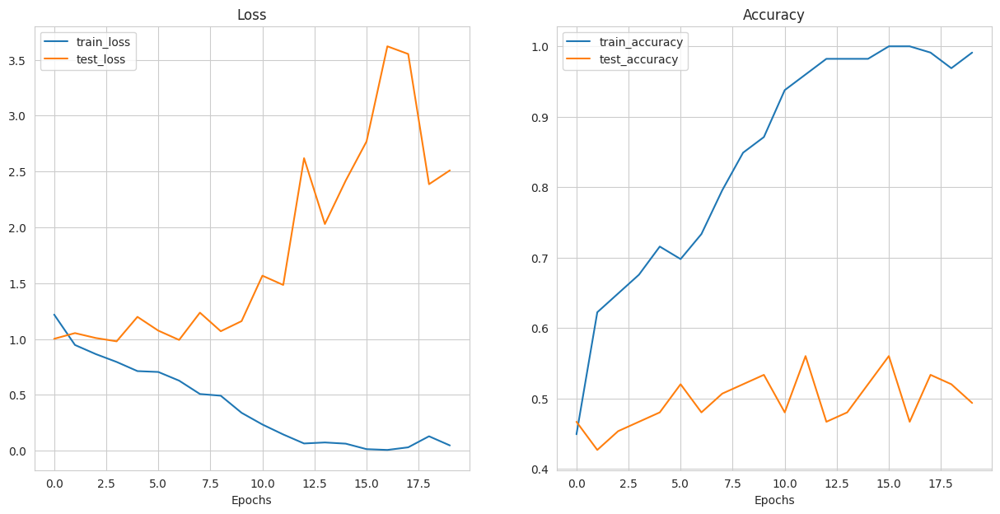

In [205]:
def plot_loss_curves(results: Dict[str, List[float]]):
    loss = results['train_loss']
    test_loss = results['test_loss']
    accuracy = results['train_acc']
    test_accuracy = results['test_acc']
    epochs = range(len(results['train_loss']))
    plt.figure(figsize=(15, 7))
    plt.subplot(1, 2, 1)
    plt.plot(epochs, loss, label='train_loss')
    plt.plot(epochs, test_loss, label='test_loss')
    plt.title('Loss')
    plt.xlabel('Epochs')
    plt.legend()
    plt.subplot(1, 2, 2)
    plt.plot(epochs, accuracy, label='train_accuracy')
    plt.plot(epochs, test_accuracy, label='test_accuracy')
    plt.title('Accuracy')
    plt.xlabel('Epochs')
    plt.legend()
    plt.show()
    
plot_loss_curves(model_0_results)

In [206]:
# Save the trained model
torch.save(model_0.state_dict(), "model_0.pth")


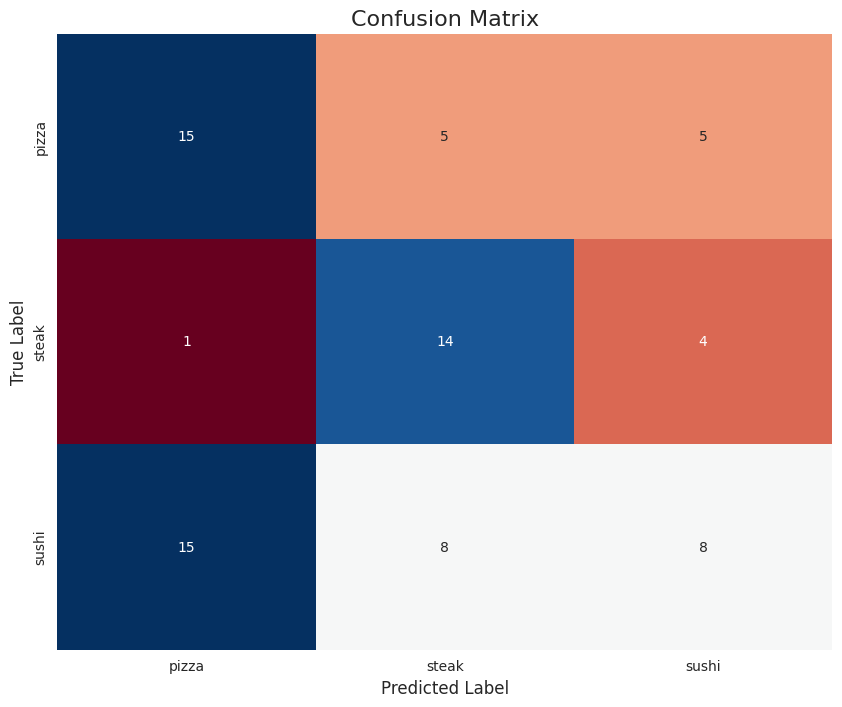

In [207]:
from sklearn.metrics import confusion_matrix
model_0.eval()

all_labels = []
all_preds = []
all_outputs = []
# Turn on inference mode
with torch.no_grad():
    for X, y in test_dataloader_custom:
        X, y = X.to(device), y.to(device)
        outputs = model_0(X)
        all_outputs.append(outputs.cpu().numpy())
        _, preds = torch.max(outputs, 1)

        all_labels.extend(y.cpu().numpy())
        all_preds.extend(preds.cpu().numpy())

# Compute confusion matrix
cm = confusion_matrix(all_labels, all_preds)

# Get class names from train data
class_names = train_data_custom.classes
plt.figure(figsize=(10,8))
sns.heatmap(cm, annot=True, fmt='d', cmap='RdBu', xticklabels=class_names, yticklabels=class_names, cbar=False)

# Add titles and labels
plt.title('Confusion Matrix', fontsize=16)
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)

# Display the plot
plt.show()

# Classification Report

In [209]:
from sklearn.metrics import classification_report
print(classification_report(all_labels,all_preds, target_names=class_names))

              precision    recall  f1-score   support

       pizza       0.48      0.60      0.54        25
       steak       0.52      0.74      0.61        19
       sushi       0.47      0.26      0.33        31

    accuracy                           0.49        75
   macro avg       0.49      0.53      0.49        75
weighted avg       0.49      0.49      0.47        75



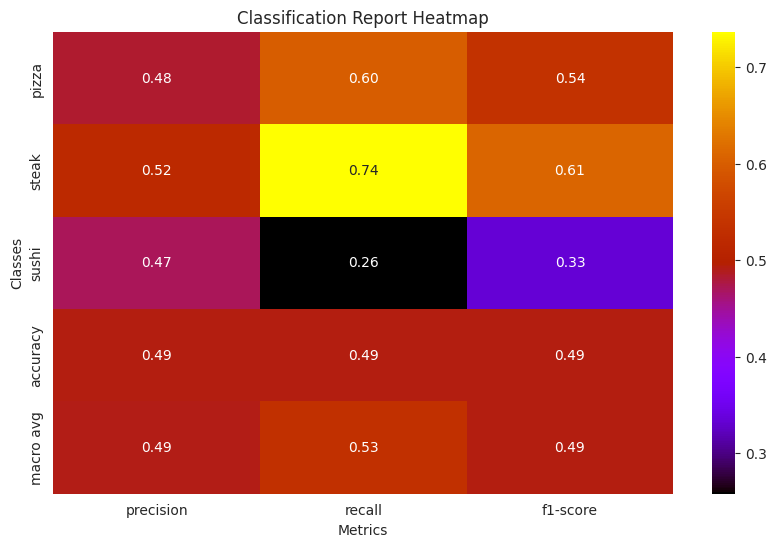

In [210]:
report = classification_report(all_labels, all_preds, target_names=class_names, output_dict=True)

# Convert the report to a DataFrame
report_df = pd.DataFrame(report).transpose()

# Plotting the heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(report_df.iloc[:-1, :-1], annot=True, fmt=".2f", cmap="gnuplot")
plt.title('Classification Report Heatmap')
plt.xlabel('Metrics')
plt.ylabel('Classes')
plt.show()

# Accuracy Score

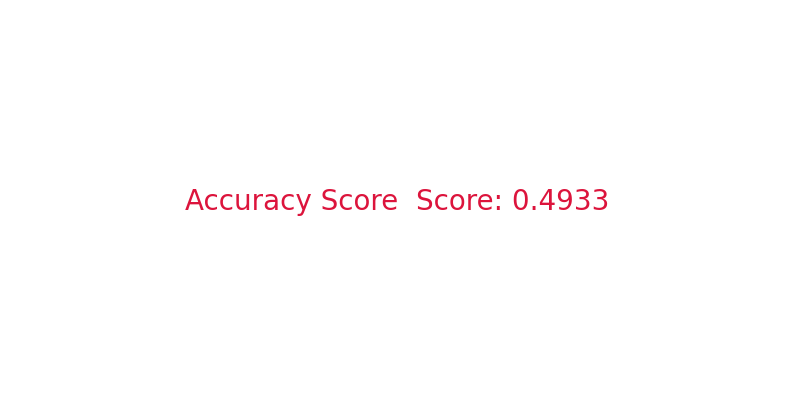

In [211]:
from sklearn.metrics import (
    accuracy_score,
    brier_score_loss,
    log_loss,
    matthews_corrcoef,
    roc_auc_score,
    cohen_kappa_score
)

plt.figure(figsize=(10,5),facecolor="white")
acc_score = accuracy_score(all_labels,all_preds)
plt.plot([])
plt.text(0,0, f'Accuracy Score  Score: {acc_score:.4f}', fontsize=20, ha='center', va='center',color="crimson")
plt.axis('off')

# Set the x-axis limits
plt.xlim(-1, 1)
plt.ylim(-1,1)

plt.show()

# ROC AUC Score

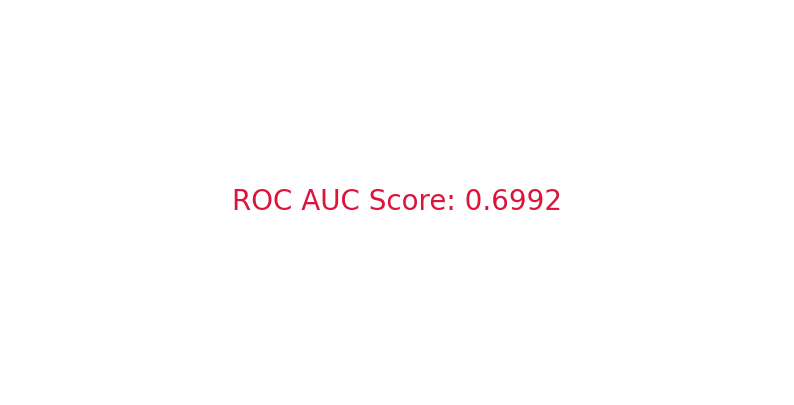

In [212]:
model_0.eval()
all_labels = []
all_outputs = []

with torch.no_grad():
    for X, y in test_dataloader_custom:
        X, y = X.to(device), y.to(device)
        outputs = model_0(X)
        
        # Apply softmax to get probabilities
        probabilities = torch.nn.functional.softmax(outputs, dim=1)
        all_outputs.append(probabilities.cpu().numpy())  # Collect probabilities

        all_labels.extend(y.cpu().numpy())

# Convert list of outputs to a 2D array
all_outputs = np.vstack(all_outputs)  # Stack the probabilities to get shape (n_samples, n_classes)

# Calculate ROC AUC score
roc_auc = roc_auc_score(all_labels, all_outputs, multi_class='ovr')

plt.figure(figsize=(10, 5), facecolor='white')
plt.plot([])
plt.text(0, 0, f'ROC AUC Score: {roc_auc:.4f}', fontsize=20, ha='center', va='center', color="crimson")
plt.axis('off')
plt.xlim(-1, 1)
plt.ylim(-1, 1)
plt.show()

# ROC AUC Score

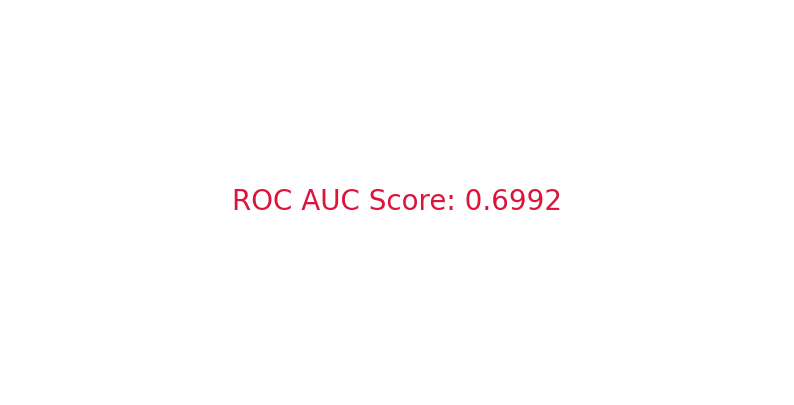

In [213]:
model_0.eval()
all_labels = []
all_outputs = []

with torch.no_grad():
    for X, y in test_dataloader_custom:
        X, y = X.to(device), y.to(device)
        outputs = model_0(X)
        
        # Apply softmax to get probabilities
        probabilities = torch.nn.functional.softmax(outputs, dim=1)
        all_outputs.append(probabilities.cpu().numpy())  # Collect probabilities

        all_labels.extend(y.cpu().numpy())

# Convert list of outputs to a 2D array
all_outputs = np.vstack(all_outputs)  # Stack the probabilities to get shape (n_samples, n_classes)

# Calculate ROC AUC score
roc_auc = roc_auc_score(all_labels, all_outputs, multi_class='ovr')

plt.figure(figsize=(10, 5), facecolor='white')
plt.plot([])
plt.text(0, 0, f'ROC AUC Score: {roc_auc:.4f}', fontsize=20, ha='center', va='center', color="crimson")
plt.axis('off')
plt.xlim(-1, 1)
plt.ylim(-1, 1)
plt.show()

# Cohen Kappa Score

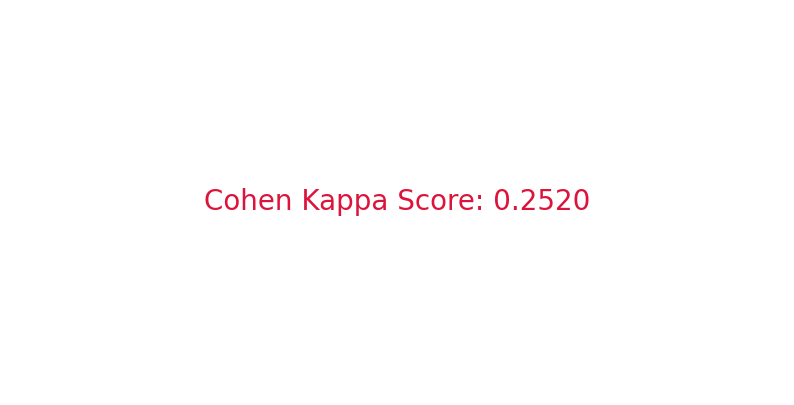

In [214]:
plt.figure(figsize=(10,5),facecolor="white")
kappa = cohen_kappa_score(all_labels,all_preds)
plt.plot([])
plt.text(0,0, f'Cohen Kappa Score: {kappa:.4f}', fontsize=20, ha='center', va='center',color="crimson")
plt.axis('off')

# Set the x-axis limits
plt.xlim(-1, 1)
plt.ylim(-1,1)

plt.show()

# Matthews Correlation Coefficient

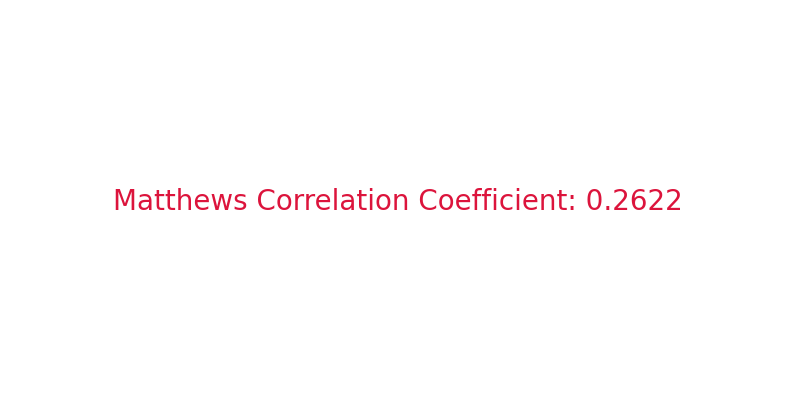

In [215]:
plt.figure(figsize=(10,5),facecolor="white")
mcc = matthews_corrcoef(all_labels,all_preds)


plt.plot([])
plt.text(0,0, f'Matthews Correlation Coefficient: {mcc:.4f}', fontsize=20, ha='center', va='center',color="crimson")
plt.axis('off')

# Set the x-axis limits
plt.xlim(-1, 1)
plt.ylim(-1,1)

plt.show()


# Calculate Brier Score Loss for each class

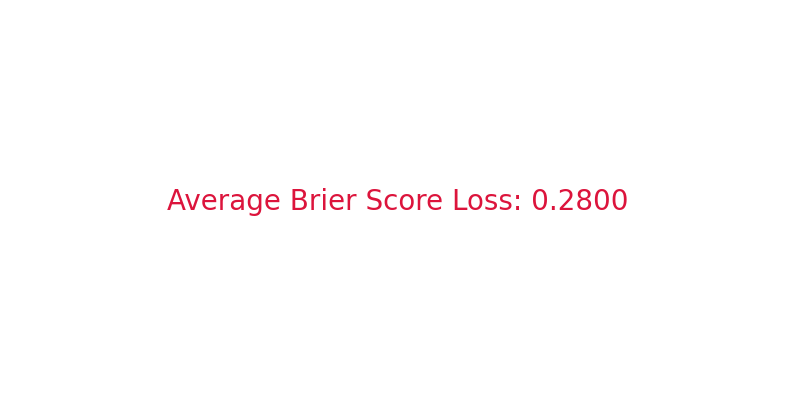

In [216]:
num_classes = all_outputs.shape[1]
brier_losses = []

for i in range(num_classes):
    y_true_binary = (np.array(all_labels) == i).astype(int)
    y_prob = all_outputs[:, i]
    brier_losses.append(brier_score_loss(y_true_binary, y_prob))

# Calculate average Brier Score Loss
avg_brier_loss = np.mean(brier_losses)

plt.figure(figsize=(10, 5), facecolor='white')
plt.plot([])
plt.text(0, 0, f'Average Brier Score Loss: {avg_brier_loss:.4f}', fontsize=20, ha='center', va='center', color="crimson")
plt.axis('off')
plt.xlim(-1, 1)
plt.ylim(-1, 1)
plt.show()

# Calculate Brier Score Loss for each class

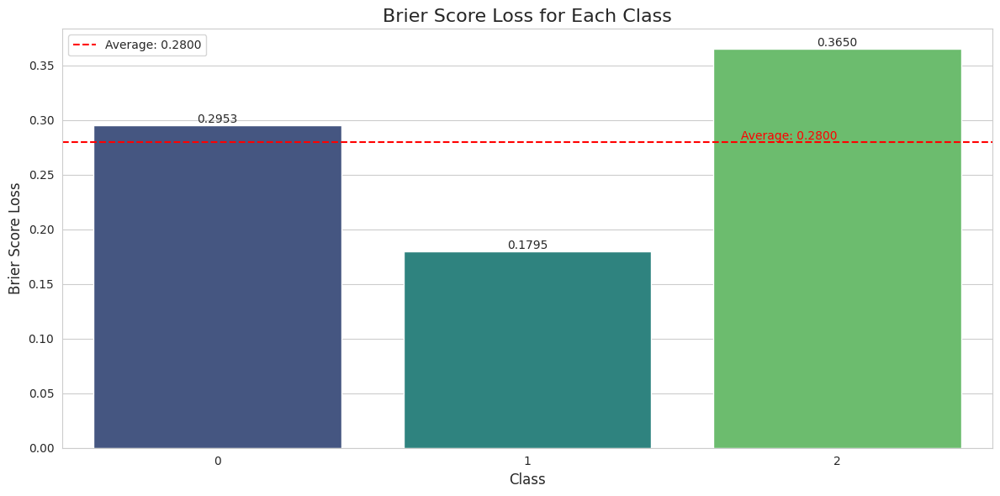

Class 0: Brier Score Loss = 0.2953
Class 1: Brier Score Loss = 0.1795
Class 2: Brier Score Loss = 0.3650
Average Brier Score Loss: 0.2800


In [217]:
num_classes = all_outputs.shape[1]
brier_losses = []

for i in range(num_classes):
    y_true_binary = (np.array(all_labels) == i).astype(int)
    y_prob = all_outputs[:, i]
    brier_loss = brier_score_loss(y_true_binary, y_prob)
    brier_losses.append(brier_loss)

# Calculate average Brier Score Loss
avg_brier_loss = np.mean(brier_losses)

# Create a DataFrame for Seaborn
df = pd.DataFrame({
    'Class': range(num_classes),
    'Brier Score Loss': brier_losses
})

# Plotting
plt.figure(figsize=(12, 6), facecolor='white')
sns.set_style("whitegrid")

# Create the bar plot
ax = sns.barplot(x='Class', y='Brier Score Loss', data=df, palette='viridis')

# Customize the plot
plt.title('Brier Score Loss for Each Class', fontsize=16)
plt.xlabel('Class', fontsize=12)
plt.ylabel('Brier Score Loss', fontsize=12)

# Add value labels on top of each bar
for i, v in enumerate(brier_losses):
    ax.text(i, v, f'{v:.4f}', ha='center', va='bottom')

# Add a horizontal line for the average Brier Score Loss
plt.axhline(y=avg_brier_loss, color='r', linestyle='--', label=f'Average: {avg_brier_loss:.4f}')

# Add text for average Brier Score Loss
plt.text(num_classes-1, avg_brier_loss, f'Average: {avg_brier_loss:.4f}', 
         fontsize=10, va='bottom', ha='right', color='r')

plt.legend()
plt.tight_layout()
plt.show()

# Print out the Brier Score Loss for each class
for i, loss in enumerate(brier_losses):
    print(f"Class {i}: Brier Score Loss = {loss:.4f}")
print(f"Average Brier Score Loss: {avg_brier_loss:.4f}")

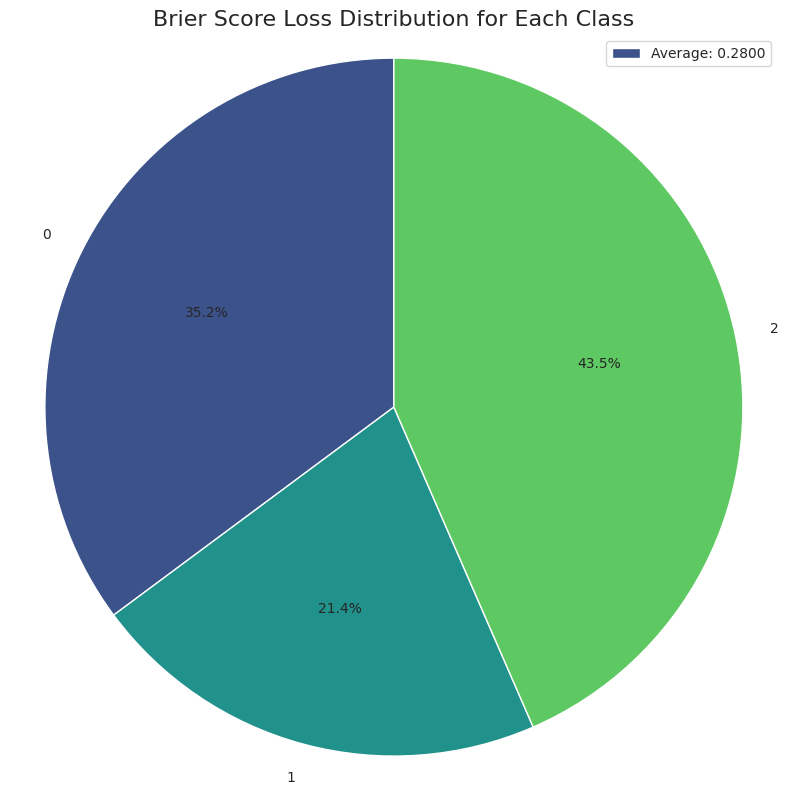

Class 0: Brier Score Loss = 0.2953
Class 1: Brier Score Loss = 0.1795
Class 2: Brier Score Loss = 0.3650
Average Brier Score Loss: 0.2800


In [218]:
num_classes = all_outputs.shape[1]
brier_losses = []

for i in range(num_classes):
    y_true_binary = (np.array(all_labels) == i).astype(int)
    y_prob = all_outputs[:, i]
    brier_loss = brier_score_loss(y_true_binary, y_prob)
    brier_losses.append(brier_loss)

# Calculate average Brier Score Loss
avg_brier_loss = np.mean(brier_losses)

# Create a DataFrame for Seaborn
df = pd.DataFrame({
    'Class': range(num_classes),
    'Brier Score Loss': brier_losses
})

# Plotting the pie chart
plt.figure(figsize=(8, 8), facecolor='white')
plt.pie(brier_losses, labels=df['Class'], autopct='%1.1f%%', startangle=90, colors=sns.color_palette("viridis", num_classes))
plt.title('Brier Score Loss Distribution for Each Class', fontsize=16)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

# Show average Brier Score Loss as a legend
plt.legend([f'Average: {avg_brier_loss:.4f}'], loc='upper right')
plt.tight_layout()
plt.show()

# Print out the Brier Score Loss for each class
for i, loss in enumerate(brier_losses):
    print(f"Class {i}: Brier Score Loss = {loss:.4f}")
print(f"Average Brier Score Loss: {avg_brier_loss:.4f}")

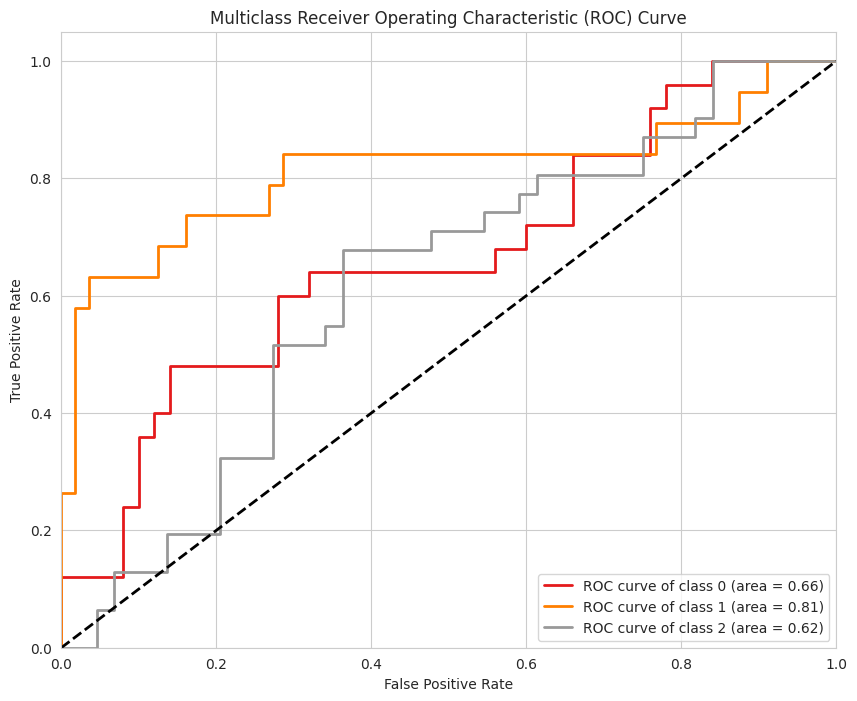

AUC for class 0: 0.6648
AUC for class 1: 0.8139
AUC for class 2: 0.6188
Micro-average AUC: 0.6788


In [219]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize



# Get the number of classes
num_classes = all_outputs.shape[1]

# Binarize the labels for multiclass ROC
all_labels_bin = label_binarize(all_labels, classes=range(num_classes))

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(all_labels_bin[:, i], all_outputs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves
plt.figure(figsize=(10, 8))

# Use the new method to get colormaps
colors = plt.colormaps['Set1'](np.linspace(0, 1, num_classes))

for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve of class {i} (area = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multiclass Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Print AUC for each class
for i in range(num_classes):
    print(f"AUC for class {i}: {roc_auc[i]:.4f}")

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(all_labels_bin.ravel(), all_outputs.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
print(f"Micro-average AUC: {roc_auc['micro']:.4f}")

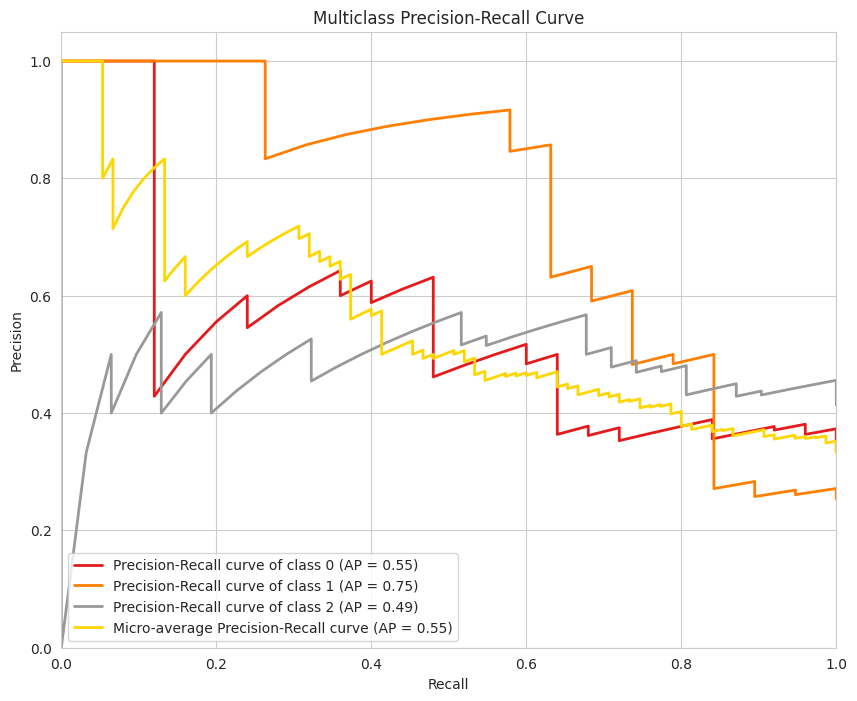

Average Precision for class 0: 0.5498
Average Precision for class 1: 0.7519
Average Precision for class 2: 0.4941
Micro-average Precision: 0.5543


In [220]:
from sklearn.metrics import precision_recall_curve, average_precision_score

# Get the number of classes
num_classes = all_outputs.shape[1]

# Binarize the labels for multiclass precision-recall curve
all_labels_bin = label_binarize(all_labels, classes=range(num_classes))

# Compute Precision-Recall curve and average precision for each class
precision = dict()
recall = dict()
average_precision = dict()

for i in range(num_classes):
    precision[i], recall[i], _ = precision_recall_curve(all_labels_bin[:, i], all_outputs[:, i])
    average_precision[i] = average_precision_score(all_labels_bin[:, i], all_outputs[:, i])

# Compute micro-average Precision-Recall curve and average precision
precision["micro"], recall["micro"], _ = precision_recall_curve(all_labels_bin.ravel(), all_outputs.ravel())
average_precision["micro"] = average_precision_score(all_labels_bin, all_outputs, average="micro")

# Plot Precision-Recall curves
plt.figure(figsize=(10, 8))

# Use the new method to get colormaps
colors = plt.colormaps['Set1'](np.linspace(0, 1, num_classes))

for i, color in zip(range(num_classes), colors):
    plt.plot(recall[i], precision[i], color=color, lw=2,
             label=f'Precision-Recall curve of class {i} (AP = {average_precision[i]:.2f})')

plt.plot(recall["micro"], precision["micro"], color='gold', lw=2,
         label=f'Micro-average Precision-Recall curve (AP = {average_precision["micro"]:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Multiclass Precision-Recall Curve')
plt.legend(loc="lower left")
plt.grid(True)
plt.show()

# Print Average Precision (AP) for each class
for i in range(num_classes):
    print(f"Average Precision for class {i}: {average_precision[i]:.4f}")

print(f"Micro-average Precision: {average_precision['micro']:.4f}")

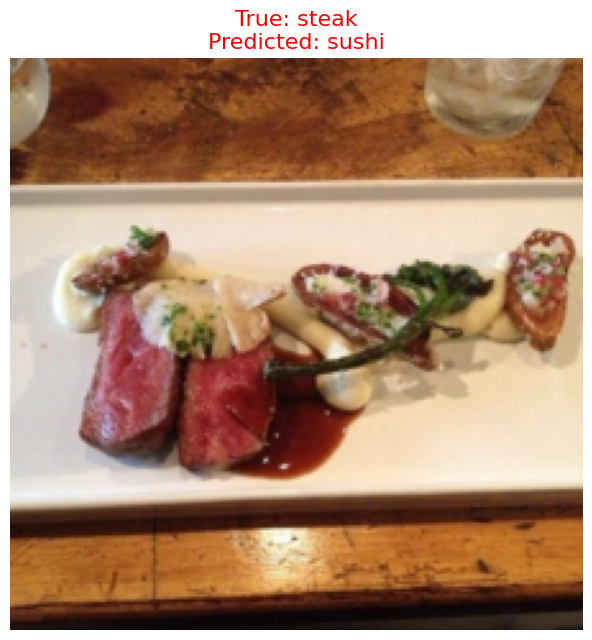

Overall accuracy: 0.00

Class-wise accuracy:
Accuracy of pizza: No samples in this batch
Accuracy of steak: 0/1 (0.00%)
Accuracy of sushi: No samples in this batch

Class distribution in this batch:
pizza: 0 samples
steak: 1 samples
sushi: 0 samples


In [221]:
import numpy as np



def imshow(img):
    """Function to convert a tensor image to a NumPy array for visualization."""
    if isinstance(img, np.ndarray):
        npimg = img
    else:
        img = img / 2 + 0.5  # unnormalize
        npimg = img.numpy()

    if npimg.shape[0] == 3:  # Check if the image has 3 channels
        return np.transpose(npimg, (1, 2, 0))  # Rearrange dimensions for matplotlib
    else:
        return npimg

# Define the classes
classes = ['pizza', 'steak', 'sushi']
class_to_idx = {'pizza': 0, 'steak': 1, 'sushi': 2}

# Set the model to evaluation mode
model_0.eval()

# Get a batch of images
dataiter = iter(test_dataloader_custom)
images, labels = next(dataiter)

# Move images and labels to the appropriate device
images, labels = images.to(device), labels.to(device)

# Get predictions
with torch.no_grad():
    outputs = model_0(images)
    _, predicted = torch.max(outputs, 1)

# Convert to numpy for easy indexing
images = images.cpu().numpy()
labels = labels.cpu().numpy()
predicted = predicted.cpu().numpy()

# Plotting the images along with true and predicted labels
plt.figure(figsize=(30, 30))
number_images = (5, 5)
num_samples = min(number_images[0] * number_images[1], len(images))

for i in range(num_samples):
    plt.subplot(number_images[0], number_images[1], i + 1)
    plt.axis("off")
    
    true_label = classes[labels[i]]
    predicted_label = classes[predicted[i]]
    
    # Set title color based on whether prediction is correct
    color = "darkgreen" if true_label == predicted_label else "red"
    
    plt.title(f"True: {true_label}\nPredicted: {predicted_label}", color=color, fontsize=16)
    plt.imshow(imshow(images[i]))

plt.tight_layout()
plt.show()

# Calculate overall accuracy
accuracy = (predicted == labels).mean()
print(f"Overall accuracy: {accuracy:.2f}")

# Print class-wise accuracy
print("\nClass-wise accuracy:")
for cls in classes:
    idx = class_to_idx[cls]
    class_correct = (predicted == labels)[labels == idx].sum()
    class_total = (labels == idx).sum()
    if class_total > 0:
        print(f"Accuracy of {cls}: {class_correct}/{class_total} ({100 * class_correct / class_total:.2f}%)")
    else:
        print(f"Accuracy of {cls}: No samples in this batch")

# Print class distribution in the batch
print("\nClass distribution in this batch:")
for cls in classes:
    idx = class_to_idx[cls]
    class_count = (labels == idx).sum()
    print(f"{cls}: {class_count} samples")
   

Predicted class: sushi


/tmp/ipykernel_30/4126353396.py:52: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("model_0.pth"))  # Make sure the path to your saved model 

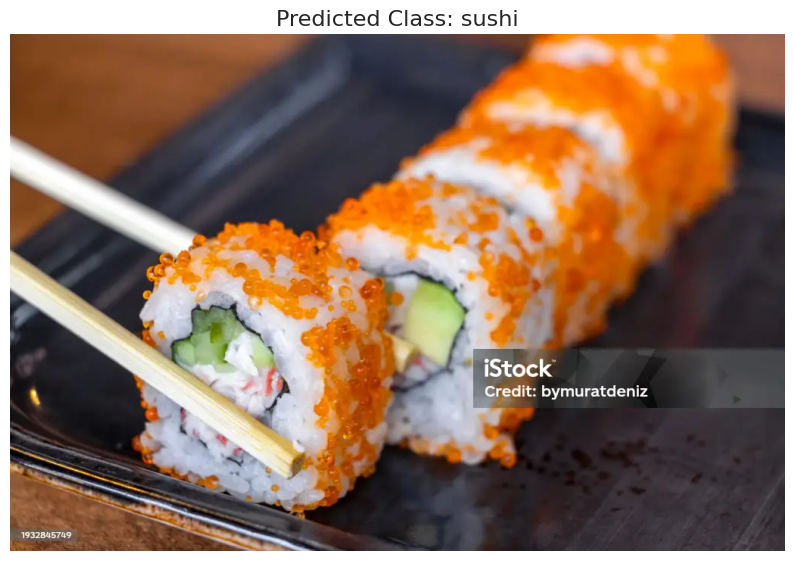

In [222]:
import torch
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

# Define custom transform
custom_transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize to match model's input dimensions
    transforms.ToTensor(),  # Convert to tensor
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize using ImageNet stats
])

# Load and transform your custom data (image)
def load_image(image_path: str):
    image = Image.open(image_path).convert("RGB")  # Open and ensure image is RGB
    return image, custom_transform(image).unsqueeze(0)  # Return both raw and transformed image with batch dimension

# Prediction function
def predict_custom_data(model: torch.nn.Module, image_tensor: torch.Tensor, device: torch.device, class_names: list):
    model.eval()  # Set model to evaluation mode
    with torch.no_grad():  # Disable gradient calculation
        image_tensor = image_tensor.to(device)  # Move image tensor to the same device as the model
        output = model(image_tensor)  # Get model predictions
        prediction = torch.argmax(output, dim=1)  # Get the index of the highest logit
        return class_names[prediction.item()]  # Convert index to class name

# Function to display the image with predicted label
def display_image_with_label(raw_image, predicted_class):
    plt.figure(figsize=(10, 8))
    plt.imshow(np.array(raw_image))  # Plot the raw image
    plt.title(f"Predicted Class: {predicted_class}", fontsize=16)  # Set the title with predicted label
    plt.axis('off')  # Hide axes
    plt.show()

# Your class names (use the same as when training the model)
class_names = ['pizza', 'steak', 'sushi']  # Replace with actual class names from your training data

# Path to your custom image
image_path = "/kaggle/input/custom-image-dataset/sushi.webp"

# Load and preprocess the image
raw_image, image_tensor = load_image(image_path)

# Load the trained model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Initialize the model architecture (same as in training)
model = TinyVGG(input_shape=3, hidden_units=10, output_shape=len(class_names)).to(device)

# Load the trained model's weights
model.load_state_dict(torch.load("model_0.pth"))  # Make sure the path to your saved model is correct

# Set the model to evaluation mode (important for inference)
model.eval()

# Predict the class for the custom image
predicted_class = predict_custom_data(model, image_tensor, device, class_names)

# Output the prediction and plot the image with label
print(f"Predicted class: {predicted_class}")
display_image_with_label(raw_image, predicted_class)
